- EDA is the process of analyzing data sets to summarize their characteristics using a combination of statistical calculations and data visualization

# Univariate
- Univariate means "one variable" or one type of data.
- Univariate data does not deal with causes or relationships between two or more variables
- There are three types of univariate statistics that we are interested in for each varaible:
    - General information : (data type, count of total values, number of unique values)
    - Range and middle : (min, max, mean, median, mode, quartiles)
    - Normality and spread : (Standard deviation, skewness, kurtosis)

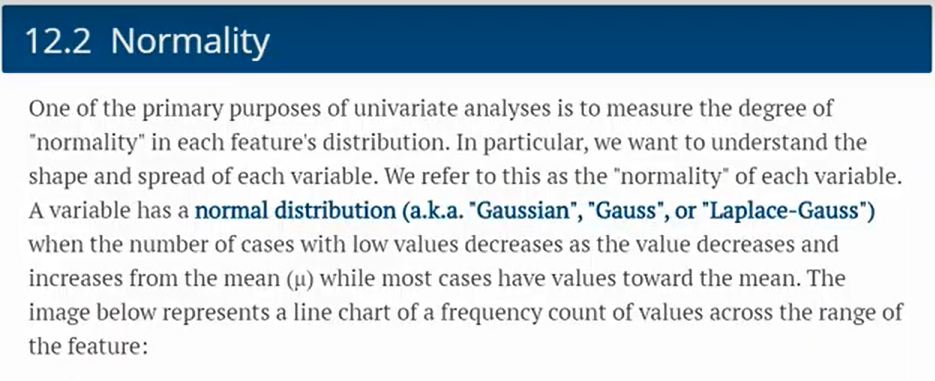

In [1]:
from IPython.display import Image
Image(filename='Normality img1.png',width=600,height=600)

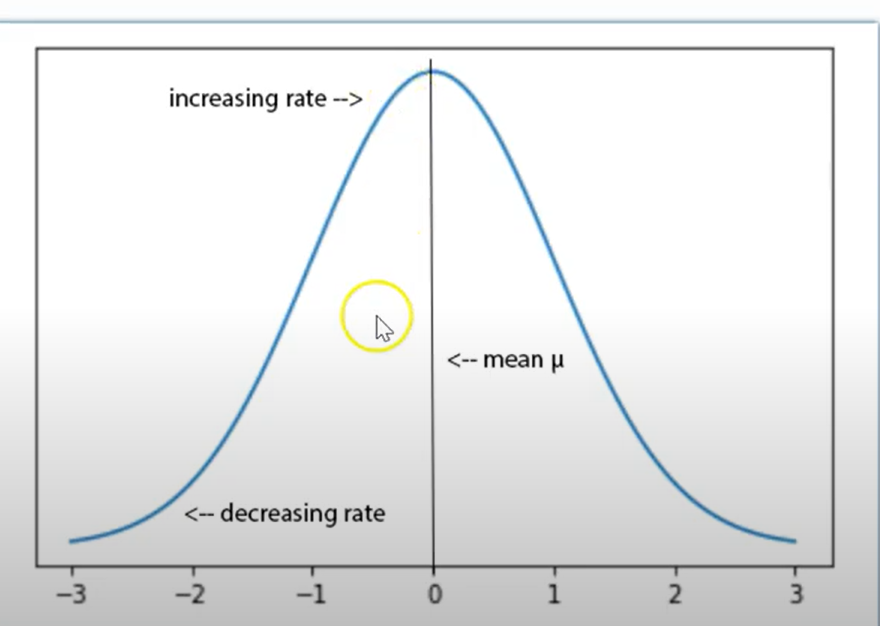

In [2]:
Image(filename='Normality img2.png',width=600,height=600)

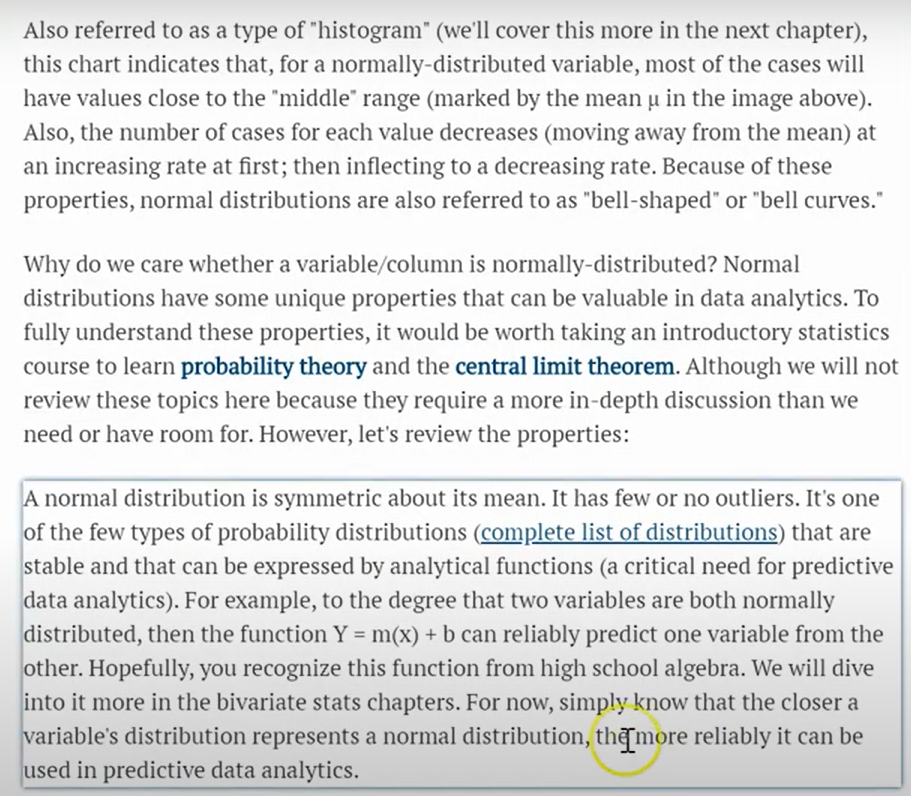

In [3]:
Image(filename='Normality img3.png',width=600,height=600)

In [4]:
import pandas as pd
df = pd.read_csv("insurance.csv")
df.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


In [5]:
df.shape

(1338, 7)

In [6]:
df.describe() #gives descriptive statistics

,age,bmi,children,charges
count,1338.000000,1338.000000,1338.000000,1338.000000
mean,39.207025,30.663397,1.094918,13270.422265
std,14.049960,6.098187,1.205493,12110.011237
min,18.000000,15.960000,0.000000,1121.873900
25%,27.000000,26.296250,0.000000,4740.287150
50%,39.000000,30.400000,1.000000,9382.033000
75%,51.000000,34.693750,2.000000,16639.912515
max,64.000000,53.130000,5.000000,63770.428010


In [7]:
print(f'age: {df.age.count()}')
print('sex: {}'.format(df.sex.count()))
print('smoker: {}'.format(df.smoker.count()))
print('region: {}'.format(df.region.count()))

age: 1338
sex: 1338
smoker: 1338
region: 1338


In [8]:
print('Age: {}'.format(df.age.nunique()))
print('Sex: {}'.format(df.sex.nunique()))
print('BMI: {}'.format(df.bmi.nunique()))
print('Children: {}'.format(df.children.nunique()))
print('smoker: {}'.format(df.smoker.nunique()))
print('region: {}'.format(df.region.nunique()))
print('Charges: {}'.format(df.charges.nunique()))

Age: 47
Sex: 2
BMI: 548
Children: 6
smoker: 2
region: 4
Charges: 1337


In [9]:
df.dtypes

age           int64
sex          object
bmi         float64
children      int64
smoker       object
region       object
charges     float64
dtype: object

In [10]:
print('region: {}'.format(df.region.dtype))
print('region: {}'.format(df.region.dtypes))

region: object
region: object


In [11]:
print('Age: {}'.format(pd.api.types.is_numeric_dtype(df.age)))
print('Sex: {}'.format(pd.api.types.is_numeric_dtype(df.sex)))
print('BMI: {}'.format(pd.api.types.is_numeric_dtype(df.bmi)))
print('Children: {}'.format(pd.api.types.is_numeric_dtype(df.children)))
print('smoker: {}'.format(pd.api.types.is_numeric_dtype(df.smoker)))
print('region: {}'.format(pd.api.types.is_numeric_dtype(df.region)))
print('Charges: {}'.format(pd.api.types.is_numeric_dtype(df.charges)))

Age: True
Sex: False
BMI: True
Children: True
smoker: False
region: False
Charges: True


In [12]:
pd.api.types.is_numeric_dtype(df)

False

In [13]:
df.isnull().sum()

age         0
sex         0
bmi         0
children    0
smoker      0
region      0
charges     0
dtype: int64

In [14]:
print('Age: {}'.format(df.age.isnull().sum()))
print('Sex: {}'.format(df.sex.isnull().sum()))
print('BMI: {}'.format(df.bmi.isnull().sum()))
print('Children: {}'.format(df.children.isnull().sum()))
print('smoker: {}'.format(df.smoker.isnull().sum()))
print('region: {}'.format(df.region.isnull().sum()))
print('Charges: {}'.format(df.charges.isnull().sum()))

Age: 0
Sex: 0
BMI: 0
Children: 0
smoker: 0
region: 0
Charges: 0


**Boundaries and the middle of the dataset**

In [15]:
import numpy as np
print(df.charges.min())
print(df.charges.quantile(.25))
print(df.charges.quantile(.50))
print(df.charges.quantile(.75))
print(df.charges.max())
print(df.charges.mean())
print(df.charges.median())
print(df.charges.mode().values[0])
print(df.charges.mode()) #sends value and first occuring index
#50% quantile and median are same

1121.8739
4740.28715
9382.033
16639.912515
63770.42801
13270.422265141257
9382.033
1639.5631
0    1639.5631
dtype: float64


**Spread: Standard deviation**
- A std tells how spread out the data is from the mean.  ie std is the measure of distance from mean.
- Its not a measure of normality.
- Better stated, it makes the ranges at which the dataset would represent a normal distribution. However, that doesnt mean that the data actually is normally-distributed.
- Rather, std represents the marking points that represent 68.2% (std=1), 95.4% (std=2) and 99.8% (std=3) of the cases in the dataset.

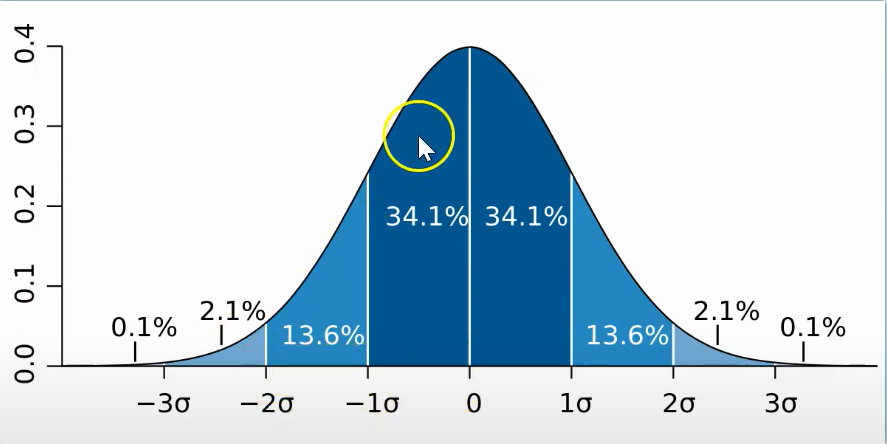

In [16]:
Image(filename='std.png',width=600,height=600)

In [17]:
df.charges.std()#assumes sample

12110.011236693994

In [18]:
np.std(df.charges)#Assumes population

12105.484975561605

In [19]:
np.std(df.charges,ddof=1)#Assumes population

12110.011236693994

**Skew and kurtosis**

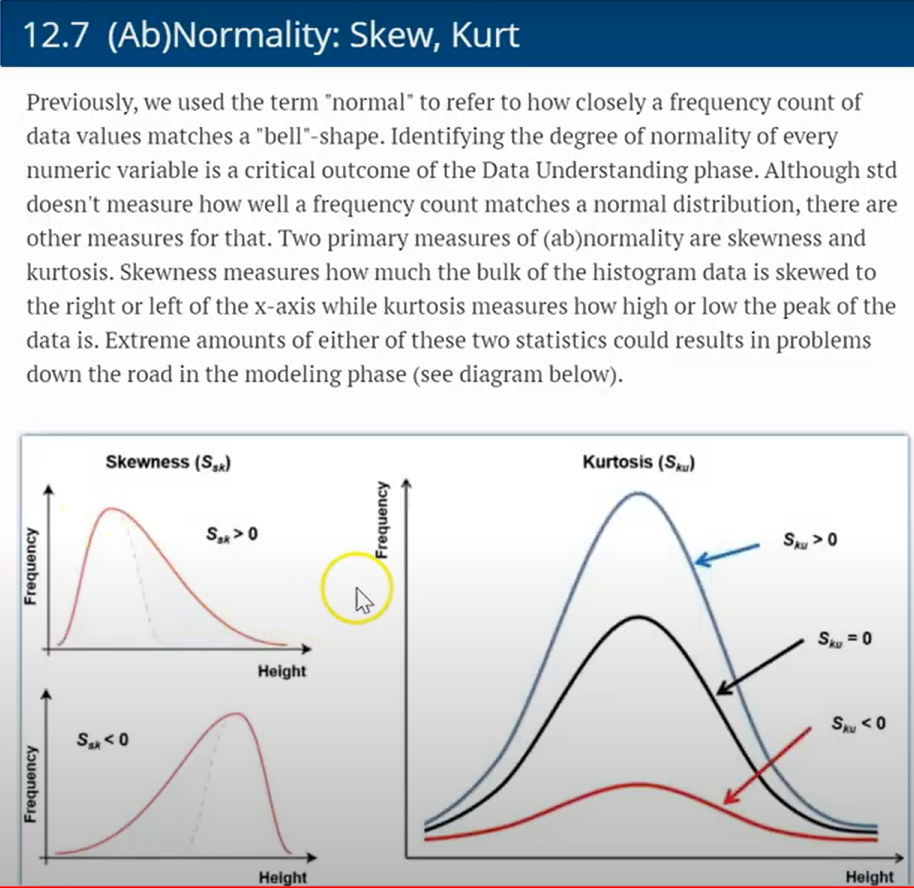

In [20]:
Image(filename='skewkur.png',width=600,height=600)

- Acceptable skew range in dataset -1 to +1
- skew=0, normal distribution

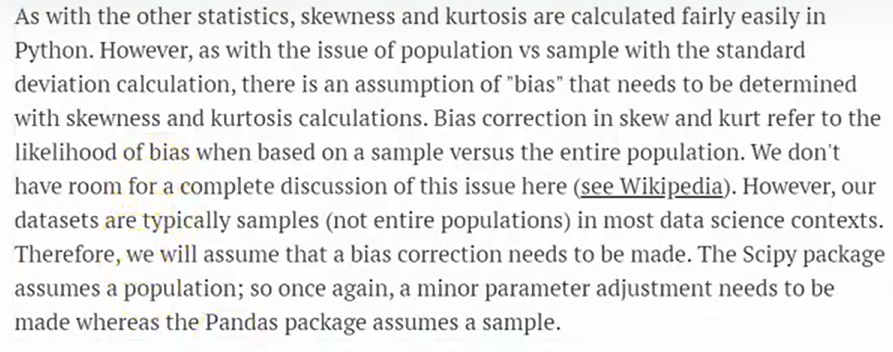

In [21]:
Image(filename='skewkur1.png',width=600,height=600)

In [22]:
print(df.charges.skew())
print(df.charges.kurtosis())
print(df.charges.kurt())

1.5158796580240388
1.6062986532967907
1.6062986532967907


In [23]:
from scipy.stats import kurtosis,skew
print(skew(df.charges))
print(kurtosis(df.charges))

1.5141797118745743
1.595821363956751


In [24]:
print(skew(df.charges,bias=False))
print(kurtosis(df.charges,bias=False))

1.5158796580240383
1.6062986532967916


# **Correlation and p-value concepts**

**Bivariate : numeric to numeric**

- Bivariate data means "two variables" or two types of data
- Bivariate analysis is examining the relationships between the pairs of variables
- With bivariate data, concerned with understanding the relationship between two variables
- features and labels
    - feature is input; label is output.
    - A feature is one column of the data in your input set. For instance, if you're trying to predict the type of pet someone will choose, your input features might include age, home region, family income, etc. The label is the final choice, such as dog, fish, iguana, rock, etc
    - The term feature is a data field used to explain or predict label. 
    - A dependent variable is something that you want to predict or explain because it represents a valuable outcome of interest
    - These dependent variables are explained or predicted by independent variables.
    - An independent variable is one that may explain or predict a dependent variable.
    - feature -> independent and label -> dependent variable

**Effect Size**

- We often refer to the relationship of a feature with label as the effect size of that feature.
- The amount of effect that each feature has on the label measured separately. 

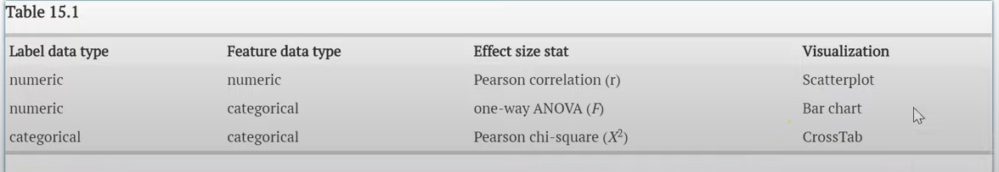

In [25]:
Image(filename='methods.png',width=1000,height=800)

**Pearson correlation**

- Pearson correlation is a statistical measure of effect size that indicates how much two numeric variables influence each other.
- The correlation coefficient 'r' rangs from -1 to 1
- Negative correlations indicate that as one varaible increases, the other variable decreases.
- Positive correlations indicate that as one varaible increases, the other variable increases as well.
- As the values get further from zero and closer to -1 anad 1, those changes become more stark and predictable with less error or variation
- small effect size : .10 < r <.29
- Medium effect size : .30 < r < .49
- Large effect size : .50 < r
- Three assumptions for a pearson correlation coefficient(r) to be validly interpreted:
    - Continuous data
    - Linear relationship
    - Homoskedastic relationship
- What to do if above assumptions are not true in our data?
    - There are two resolutions:
        - Select a statistic that doesnt depend on these assumptions
        - Adjust the scale of the data using mathematical transformation
    - The family of non-parametric(a.k.a. distribution free) statistics does not depend on normal distribution methods of calculating a correlation coefficient (r). Ex:Kendall's(tau) or Spearman's(rho or rs) correlation coefficient, if skewness is greater than 1 and less than -1

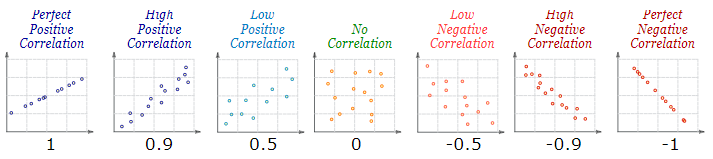

In [26]:
Image(filename='cor-ex.png',width=800,height=600)

**Probability: P-Value**

- In addition to effect size, another statistic that is commonly calculated is the probability that the estimated effect size is due to random 'chance'.
- P-Value is the probability that future data collections will have results at least as extreme as those observed in the test data -- assuming that there is actually no relationship.
- P-Values are determined by two factors:
    - frequency of occurrence(ie sample size)
    - The breadth of possible outcomes(degrees of freedom)
- Higher the sample size tend to decrease p-values while higher degrees of freedom(dof) tends to increase p-values    
- The generally accepted threshold for p-value is 0.05 - meaning that there must be less than a 5% likelihood that age/charges(our ex) correlation we found would occur again if there was truly no relationship
- the lower the p-value, the lower the likelihood that there is no relationship between two variables.

In [27]:
import numpy as np
height = [60,62,65,68,70,74]
weight = [140,138,150,166,190,250]
print(np.corrcoef(height,weight))
print(np.corrcoef(height,weight)[0][1])

[[1.         0.92989745]
 [0.92989745 1.        ]]
0.9298974521408027


In [28]:
df = pd.read_csv("insurance.csv")
df.corr()

,age,bmi,children,charges
age,1.000000,0.109272,0.042469,0.299008
bmi,0.109272,1.000000,0.012759,0.198341
children,0.042469,0.012759,1.000000,0.067998
charges,0.299008,0.198341,0.067998,1.000000


In [29]:
df.charges.corr(df.age)

0.2990081933306476

In [30]:
from scipy import stats
corr = stats.pearsonr(df.charges,df.age)
corr

(0.29900819333064765, 4.8866933317203816e-29)

In [31]:
r,p = stats.pearsonr(df.charges,df.age)
print(round(r,4))
print(round(p,4))
#0.299 : it is extremely likely that we will see correlation again the next time we collect 1300 more samples, if they are randomly selected from the same population
#0.0 : very low likelihood that we will not see 0.299 again 

0.299
0.0


In [32]:
corr_df = pd.DataFrame(columns=['r','p'])
for col in df:
    #UFuncTypeError: ufunc 'add' did not contain a loop with signature matching types (dtype('<U32'), dtype('<U32')) -> dtype('<U32')
    #gives above erro when any column is not numeric
    if pd.api.types.is_numeric_dtype(df[col]) and col != 'charges':
        r,p = stats.pearsonr(df.charges,df[col])
        corr_df.loc[col] = [round(r,3),round(p,3)]
corr_df

,r,p
age,0.299,0.000
bmi,0.198,0.000
children,0.068,0.013


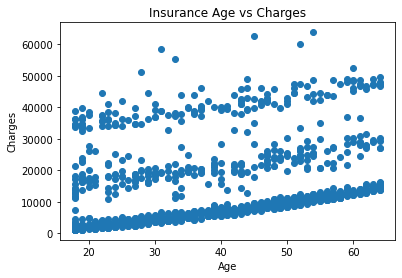

In [33]:
import matplotlib.pyplot as plt
plt.scatter(df.age,df.charges)
plt.title("Insurance Age vs Charges")
plt.xlabel('Age')
plt.ylabel('Charges')
plt.show()

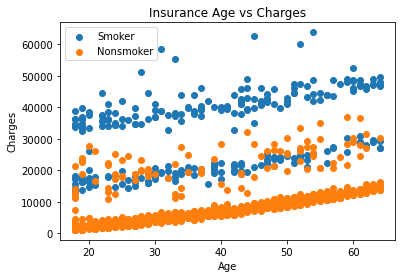

In [34]:
import matplotlib.pyplot as plt
df_smoker = df[df['smoker']=='yes']
df_nonsmoker = df[df['smoker']=='no']
plt.scatter(df_smoker.age,df_smoker.charges,label='Smoker')
plt.scatter(df_nonsmoker.age,df_nonsmoker.charges,label='Nonsmoker')
plt.title("Insurance Age vs Charges")
plt.xlabel('Age')
plt.ylabel('Charges')
plt.legend()
plt.show()

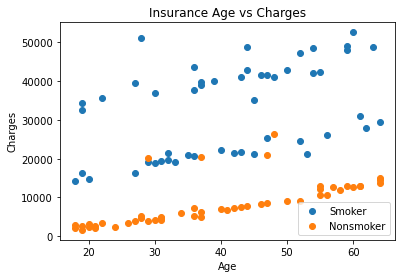

In [35]:
df_smoker_reduced = df_smoker.sample(50) #sample(50) randomly select 50 cases from dataframe
df_nonsmoker_reduced = df_nonsmoker.sample(50)
plt.scatter(df_smoker_reduced.age,df_smoker_reduced.charges,label='Smoker')
plt.scatter(df_nonsmoker_reduced.age,df_nonsmoker_reduced.charges,label='Nonsmoker')
plt.title("Insurance Age vs Charges")
plt.xlabel('Age')
plt.ylabel('Charges')
plt.legend()
plt.show()

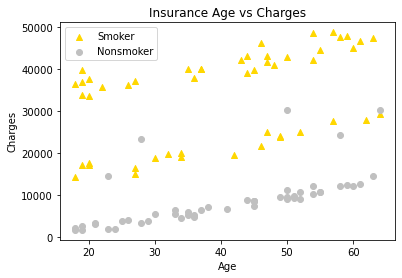

In [36]:
df_smoker_reduced = df_smoker.sample(50) #sample(50) randomly select 50 cases from dataframe
df_nonsmoker_reduced = df_nonsmoker.sample(50)
plt.scatter(df_smoker_reduced.age,df_smoker_reduced.charges,label='Smoker',color='gold',marker='^')
plt.scatter(df_nonsmoker_reduced.age,df_nonsmoker_reduced.charges,label='Nonsmoker',color='silver',marker='o')
plt.title("Insurance Age vs Charges")
plt.xlabel('Age')
plt.ylabel('Charges')
plt.legend()
plt.show()

**Linear regression**
- represents a line that will minimize the sum of squared residuals between each dot and line itself
- regression line is basically a bivariate prediction meaning where ever taht line goes its going to represent the actual trend of the dots

LinregressResult(slope=257.7226186668954, intercept=3165.8850060630302, rvalue=0.2990081933306476, pvalue=4.886693331718841e-29, stderr=22.5023892867703, intercept_stderr=937.1494650703767)


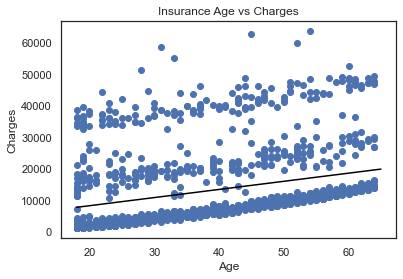

In [70]:
from scipy import stats

print(stats.linregress(df.age,df.charges))
# y = mx+b
# y = (slope)x + intercept
# stderr : represents the spread of the dots around the line
m,b,r,p,err = stats.linregress(df.age,df.charges) # to store values
#x = range(18,65)
x = range(df.age.min(),df.age.max()+2)
y = m * x + b

plt.plot(x,y,color='black')
#large number of overlapping non smoker dots pulling line towards them
plt.scatter(df.age,df.charges)
plt.title("Insurance Age vs Charges")
plt.xlabel('Age')
plt.ylabel('Charges')
plt.show()

**Heteroskedastic**

- Heteroskedasticity represents the spread of dots across all values of x
- So in above graph spread is fairly consistent across all values of x. Now calculate some stat to prove that

In [38]:
#Bivariate heteroskedasticity test

from statsmodels.stats.diagnostic import het_breuschpagan
from statsmodels.stats.diagnostic import het_white
from statsmodels.formula.api import ols

model = ols(formula='charges~age',data=df).fit() #Ordinary least squares
#model = ols(formula='age~charges',data=df).fit() #Ordinary least squares

white_test = het_white(model.resid,model.model.exog)
 #resid:passing in the individual x values themselves. exog:grab independent variable
#resid : array_like, The residuals.
#exog : array_like, The explanatory variables for the variance.

breuschpagan_test = het_breuschpagan(model.resid,model.model.exog)

output_df = pd.DataFrame(columns=['LM stat','LM p','F stat','F stat p'])
# LM stat:lagrange multiplier statistic
# F stat : effect size
output_df.loc['white'] = white_test
output_df.loc['breusch-pagan'] = breuschpagan_test
output_df

,LM stat,LM p,F stat,F stat p
white,0.002713,0.998645,0.001353,0.998648
breusch-pagan,0.000413,0.983776,0.000413,0.983792


In [71]:
white_test

(0.002712526304587959,
 0.9986446561569198,
 0.0013532249469379945,
 0.9986476916189385)

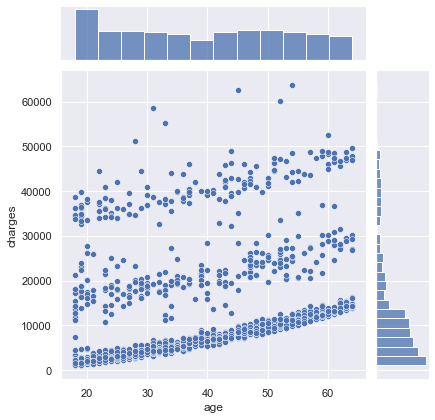

In [39]:
import seaborn as sns
sns.set(color_codes=True)
sns.jointplot(x='age',y='charges',data=df)

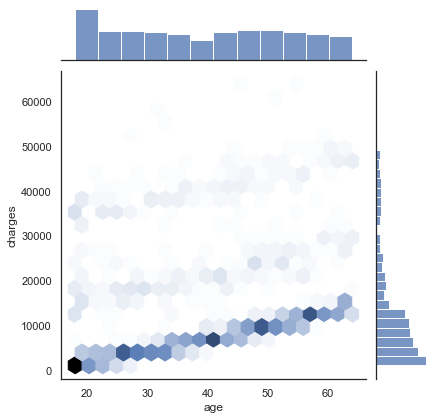

In [40]:
sns.set_style("white")
sns.jointplot(x='age',y='charges',data=df,kind='hex')

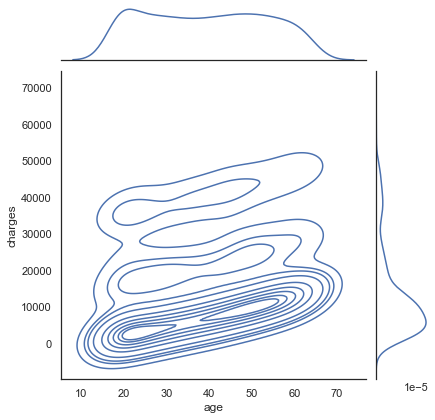

In [41]:
sns.jointplot(x='age',y='charges',data=df,kind='kde')

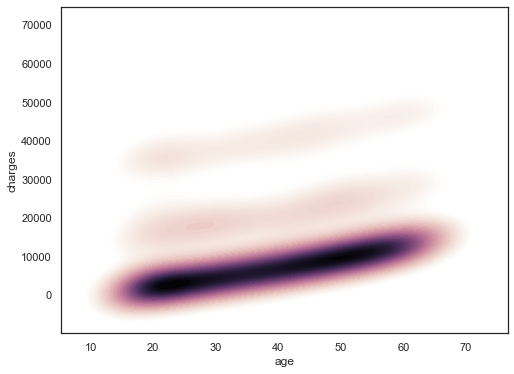

In [42]:
f,ax = plt.subplots(figsize=(8,6))
cmap = sns.cubehelix_palette(as_cmap=True,dark=0,light=1,reverse=False)
sns.kdeplot(x=df.age,y=df.charges,cmap=cmap,n_levels=60,shade=True);

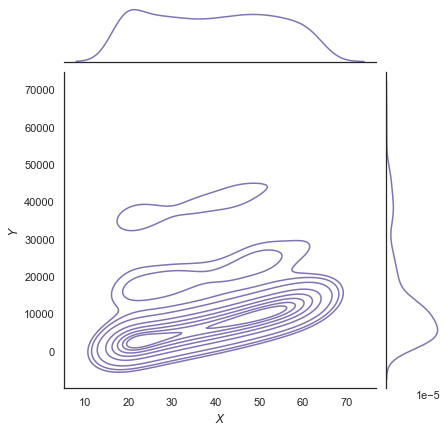

In [75]:
g = sns.jointplot(x='age',y='charges',data=df,kind='kde',color='m')
g.plot_joint(plt.scatter,c='w',s=30,linewidth=1,marker='+')
g.ax_joint.collections[0].set_alpha(0)
g.set_axis_labels("$X$",'$Y$');

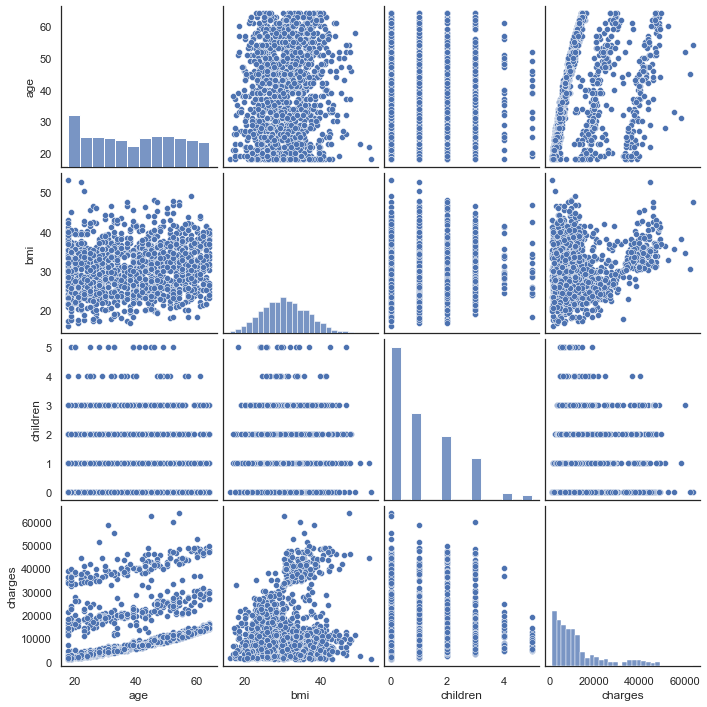

In [44]:
#df.dropna(inplace=True)
sns.pairplot(df);

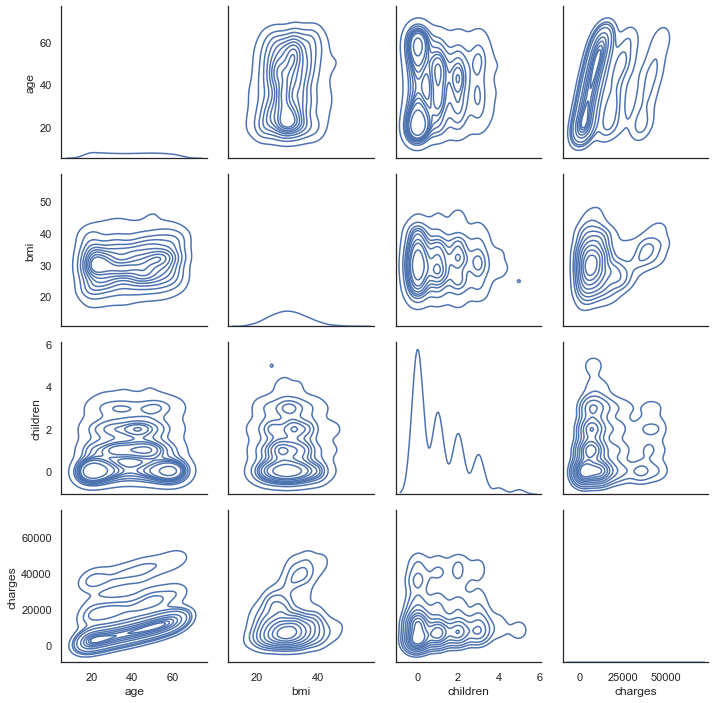

In [45]:
g = sns.PairGrid(df)
g.map_diag(sns.kdeplot)
g.map_offdiag(sns.kdeplot,n_levels=10)

C:\Users\Priya\AppData\Local\Temp/ipykernel_17848/903157999.py:9: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  three_d_plot = Axes3D(fig)


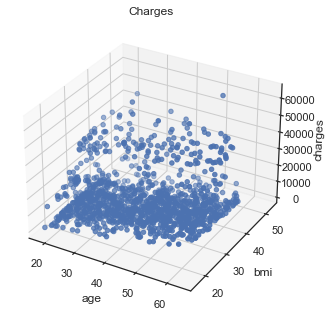

In [46]:
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

#The following two lines change the font size of matplotlib
font = {'size':8}
plt.rc('font',**font)

fig = plt.figure()
three_d_plot = Axes3D(fig)
three_d_plot.scatter(xs=df.age,ys=df.bmi,zs=df.charges)
three_d_plot.set_title("Charges")
three_d_plot.set_xlabel("age")
three_d_plot.set_ylabel("bmi")
three_d_plot.set_zlabel("charges")

plt.show()

In [47]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [48]:
import pandas as pd
import plotly.express as px

fig = px.scatter_3d(df,x='age',y='charges',z='bmi',color='smoker',symbol='sex',size='children')
fig.show()

# T-test, one-way ANOVA, p-value concepts

**Bivariate : numeric to categorical**

- t-test allows to compare two groups.
    - produces both a t-statistic and a p-value.
    - unlike correlation(r),t-stat is not bounded between -1 and 1, but rather -infinity to infinity
    - after t-statistic is produced, the associated p-value is generated by calculating a confidence interval and degree of freedom
    - before, we can retrieve the correct p-value, we need to determine whether the test is one-tailed or two-tailed
- one-way anova allows to compare three pr more groups.
    - anova:analysis of variance
    - A 'one-way' Anova is a certain type that is based on analyzing a bivariate relationship with one categorical feature and one numerical label.
- The term 'groups' is often used to refer to the category values in a particular feature. For ex:The 'smoker' feature has two groups: 'yes' and 'no'
- Example:
    - t-test tells if smokers and non-smokers differ in the mean of the insurance charges they incure.
    - If have more than two groups, a one-way anova tells whether there is a significant difference in the mean of the numeric values across three or more groups of a categorical variable(e.g. region:northwest,northeast,southwest,southeast)
- The statistics generated by a one-way ANOVA(F) and t-test(t) are unique from the pearson correlation statistic(r) and therefore, cannot be compared even though they are all measures of effect size. However, all effect size measures can produce a p-value that is comparable(to a degree)

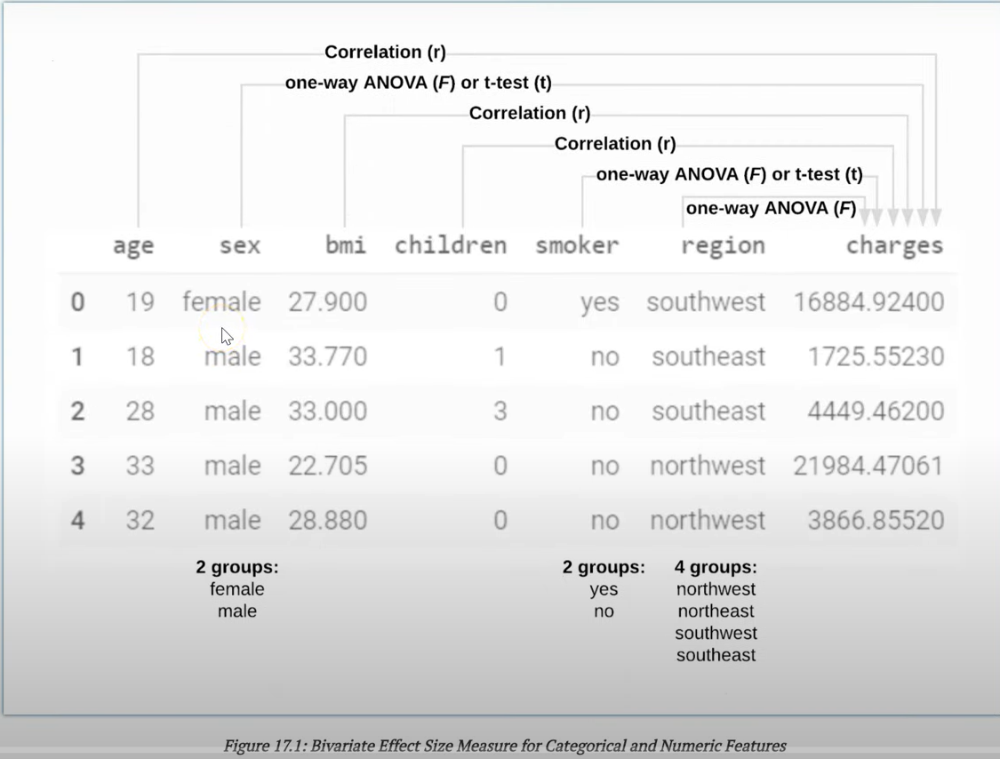

In [49]:
Image(filename='measure_effectsize.png',width=600,height=600)

**t-test**

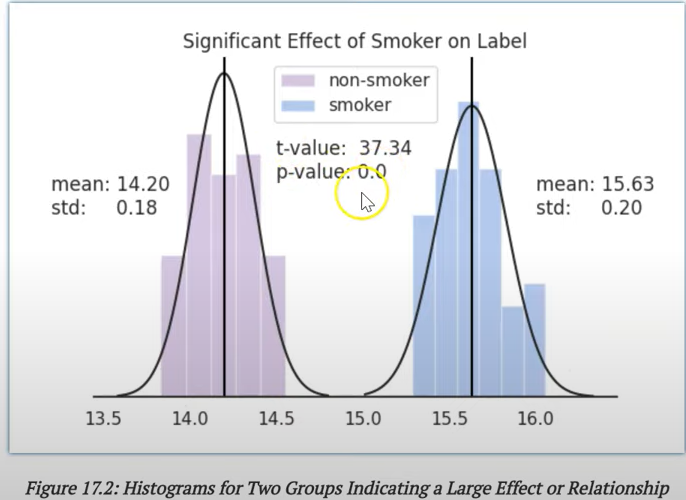

In [50]:
Image(filename='t-test1.png',width=400,height=400)

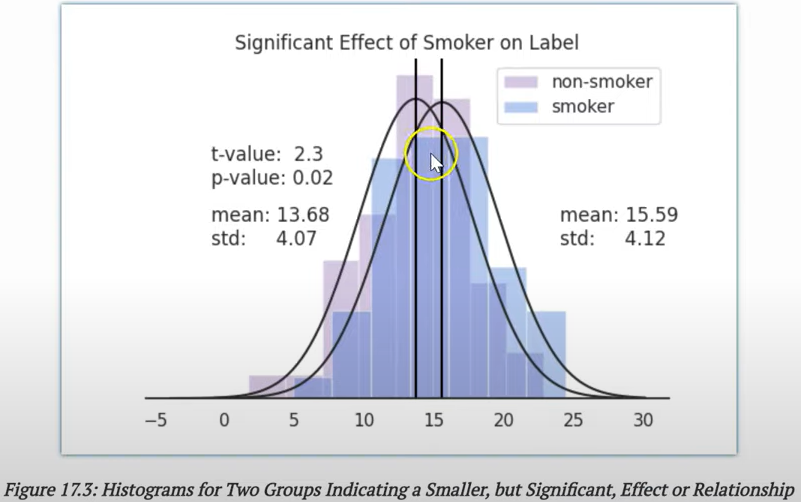

In [51]:
Image(filename='t-test2.png',width=400,height=400)

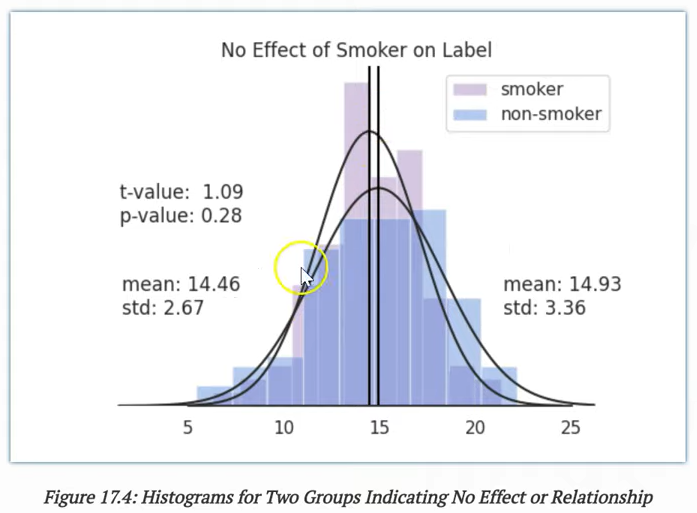

In [52]:
Image(filename='t-test3.png',width=400,height=400)

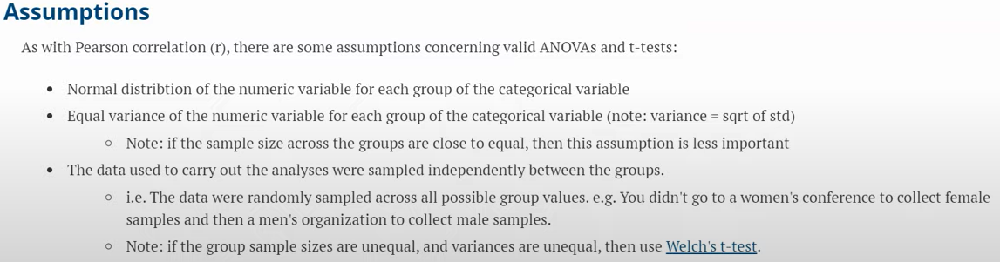

In [53]:
Image(filename='anova_t.png',width=800,height=600)

**Anova**

- If Anova performed on the relationship between the region feature and the charges label of the insurance dataset, then higher F scores indicate that there is a larger difference in insurance charge means across the four regions in the dataset.
- In other words, you can explain(at least partly) how much a customer will cost to the insurance company based on where they live. 
- However, you cannot say, for ex, that living in the northeast costs significantly more than the southeast. To make that claim, you would need to perform a t-test to compare only those two groups.
- the result of f stat is not going to be negative like t-test
- degree of freedom = number of groups - 1

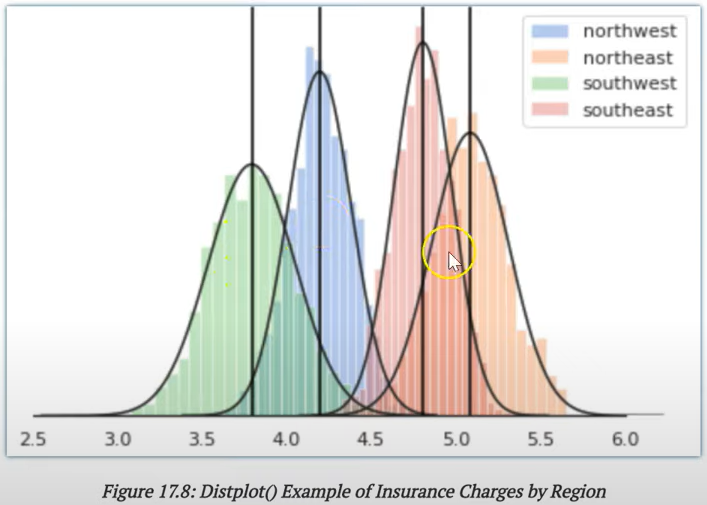

In [54]:
Image(filename='anova.png',width=400,height=400)

**Example**

In [55]:
from scipy import stats
import statistics as stat

#Lets start with some simply data in list form
edu_partialhighschool = [30000,10000,10000,20000,70000,30000,10000,20000,10000,30000]
edu_highschool = [20000,30000,60000,20000,40000,60000,60000]
edu_partialcollege = [60000,40000,30000,130000,60000,40000]
edu_bachelors = [40000,20000,90000,120000,60000,130000,20000,100000,80000,30000,100000,120000]
edu_graduate = [160000,50000,80000,30000,40000,80000,130000,100000,130000,50000,130000]

print('Partial High school: ' + str(int(stat.mean(edu_partialhighschool))))
print('High school:         ' + str(int(stat.mean(edu_highschool))))
print('Partial College:     ' + str(int(stat.mean(edu_partialcollege))))
print('Bachelors:           ' + str(int(stat.mean(edu_bachelors))))
print('Graduate:            ' + str(int(stat.mean(edu_graduate))))

Partial High school: 24000
High school:         41428
Partial College:     60000
Bachelors:           75833
Graduate:            89090


In [56]:
t, p = stats.ttest_ind(edu_partialhighschool,edu_highschool)
print(f't-value: {t}')
print(f'p-value: {p}')
#the difference between edu_partialhighschool and edu_highschool is not so large that we can reliably say that there is significant difference between them

t-value: -1.9131753750607228
p-value: 0.07500898731578687


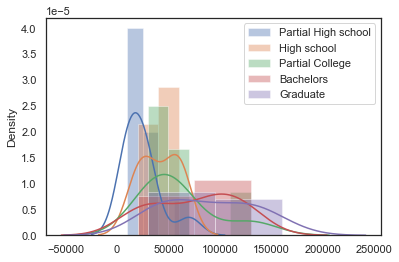

In [57]:
import warnings
warnings.filterwarnings("ignore")

import seaborn as sns
import matplotlib.pyplot as plt

sns.distplot(edu_partialhighschool,label = 'Partial High school')
sns.distplot(edu_highschool,label = 'High school')
sns.distplot(edu_partialcollege,label = 'Partial College')
sns.distplot(edu_bachelors,label = 'Bachelors')
sns.distplot(edu_graduate,label = 'Graduate')
plt.legend()

In [58]:
f,p = stats.f_oneway(edu_partialhighschool,edu_partialcollege,edu_highschool,edu_graduate,edu_bachelors)
print(f'f-value: {f}')
print(f'p-value: {p}')

f-value: 5.778065095961634
p-value: 0.0008781084858502028


In [59]:
df.head(2)

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.90,0,yes,southwest,16884.9240
1,18,male,33.77,1,no,southeast,1725.5523


In [60]:
col = 'smoker'
label = 'charges'

groups = df[col].unique()
df_grouped = df.groupby(col)
#print(df_grouped.first().reset_index())
group_labels = []
for g in groups:
    g_list = df_grouped.get_group(g)
    group_labels.append(g_list[label])
    #print(group_labels)
oneway = stats.f_oneway(*group_labels)
f = oneway[0]
p = oneway[1]
print("F: " + str(round(f,3)))
print("P: " + str(round(p,3)))


F: 2177.615
P: 0.0


<AxesSubplot:xlabel='charges', ylabel='Count'>

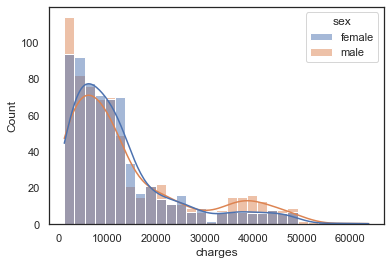

In [61]:
sns.histplot(data=df,x='charges',hue='sex',kde=True)

In [62]:
sex_m = df[df['sex']=='male']
sex_f = df[df['sex']=='female']
stats.ttest_ind(sex_m['charges'],sex_f['charges'])

Ttest_indResult(statistic=2.097546590051688, pvalue=0.03613272100592976)

<AxesSubplot:xlabel='charges', ylabel='Count'>

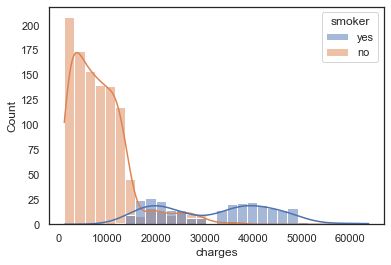

In [63]:
sns.histplot(data=df,x='charges',hue='smoker',kde=True)

In [64]:
smoker_y = df[df['smoker']=='yes']
smoker_n = df[df['smoker']=='no']
stats.ttest_ind(smoker_y['charges'],smoker_n['charges'])

Ttest_indResult(statistic=46.66492117272371, pvalue=8.271435842179102e-283)

In [65]:
feature = 'smoker'
label = 'charges'

groups = df[feature].unique()
grouped_values=[]
for group in groups:
    grouped_values.append(df[df[feature]==group][label])
stats.f_oneway(*grouped_values)

F_onewayResult(statistic=2177.614868056519, pvalue=8.271435842182967e-283)

In [76]:
feature = 'sex'
label = 'charges'

groups = df[feature].unique()
grouped_values=[]
for group in groups:
    grouped_values.append(df[df[feature]==group][label])
stats.f_oneway(*grouped_values)

F_onewayResult(statistic=4.3997016974374565, pvalue=0.03613272100596256)

In [77]:
grouped_values

[0       16884.92400
 5        3756.62160
 6        8240.58960
 7        7281.50560
 9       28923.13692
            ...     
 1332    11411.68500
 1334     2205.98080
 1335     1629.83350
 1336     2007.94500
 1337    29141.36030
 Name: charges, Length: 662, dtype: float64,
 1        1725.55230
 2        4449.46200
 3       21984.47061
 4        3866.85520
 8        6406.41070
            ...     
 1324     4239.89265
 1325    13143.33665
 1327     9377.90470
 1329    10325.20600
 1333    10600.54830
 Name: charges, Length: 676, dtype: float64]

In [67]:
feature = 'region'
label = 'charges'

groups = df[feature].unique()
grouped_values=[]
for group in groups:
    grouped_values.append(df[df[feature]==group][label])
stats.f_oneway(*grouped_values)

F_onewayResult(statistic=2.96962669358912, pvalue=0.0308933560705201)

In [68]:
def anova(feature,label):
    groups = df[feature].unique()
    grouped_values=[]
    for group in groups:
        grouped_values.append(df[df[feature]==group][label])
    return stats.f_oneway(*grouped_values)
anova('smoker','charges')

F_onewayResult(statistic=2177.614868056519, pvalue=8.271435842182967e-283)